**22.01.2025**

**PRiAD 2024 Projekt Teamat: Wpływ cyfryzacji na średni poziom zamożności w danym kraju.**

**Paweł Myszka Jakub Hamerlik**

https://www.kaggle.com/datasets/jocelyndumlao/digitalizations-impact-on-economic-growth

Cz.1
 Analiza eksploracyjna:
 * Wykresy
 * Korelacje danych
 * Analiza powyższych wyników

Cz.2
Uczenie maszynowe: spróbujemy przewidywać na podstawie danych takich jak:
* Zużyccie internetu
* Subskrypcje telefoniczne
na jakim poziomie jest średni dochód na mieszkańca w danym kraju. Przykład 1 - 4 (1 to wysoki przychód a 4 niski).


**CZĘŚĆ 1**

Liczba wierszy po oczyszczeniu: 2729


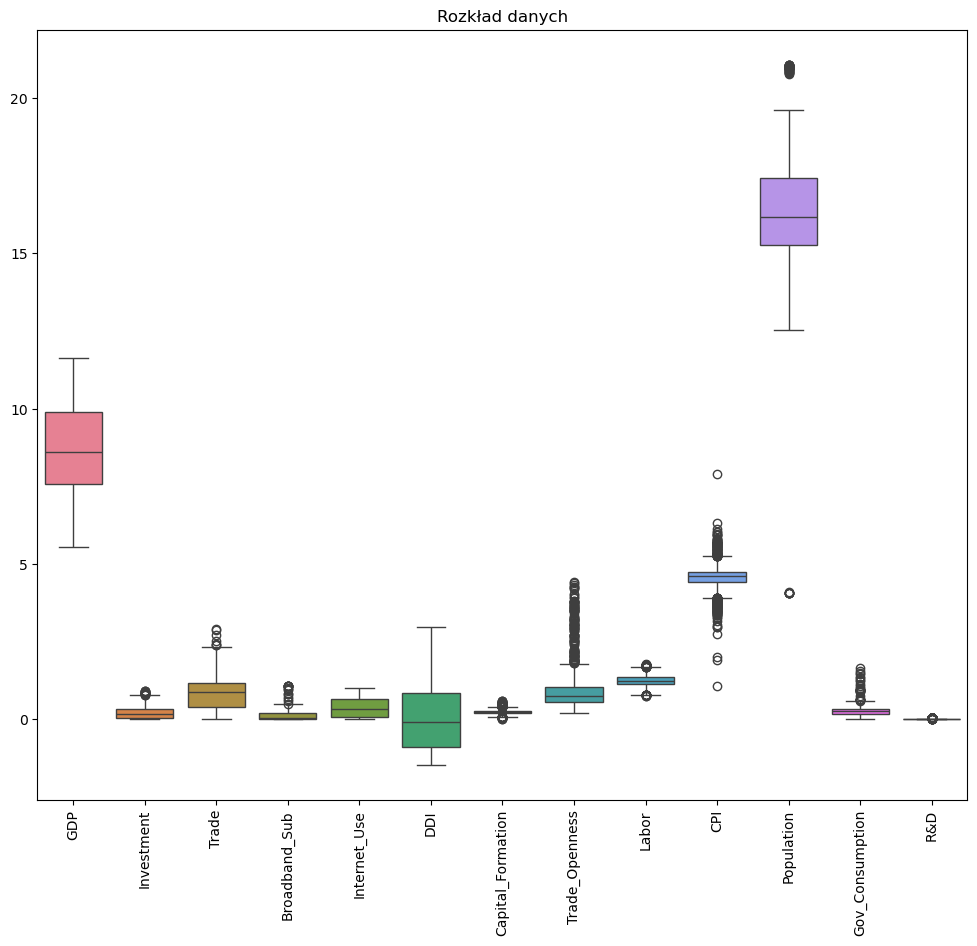

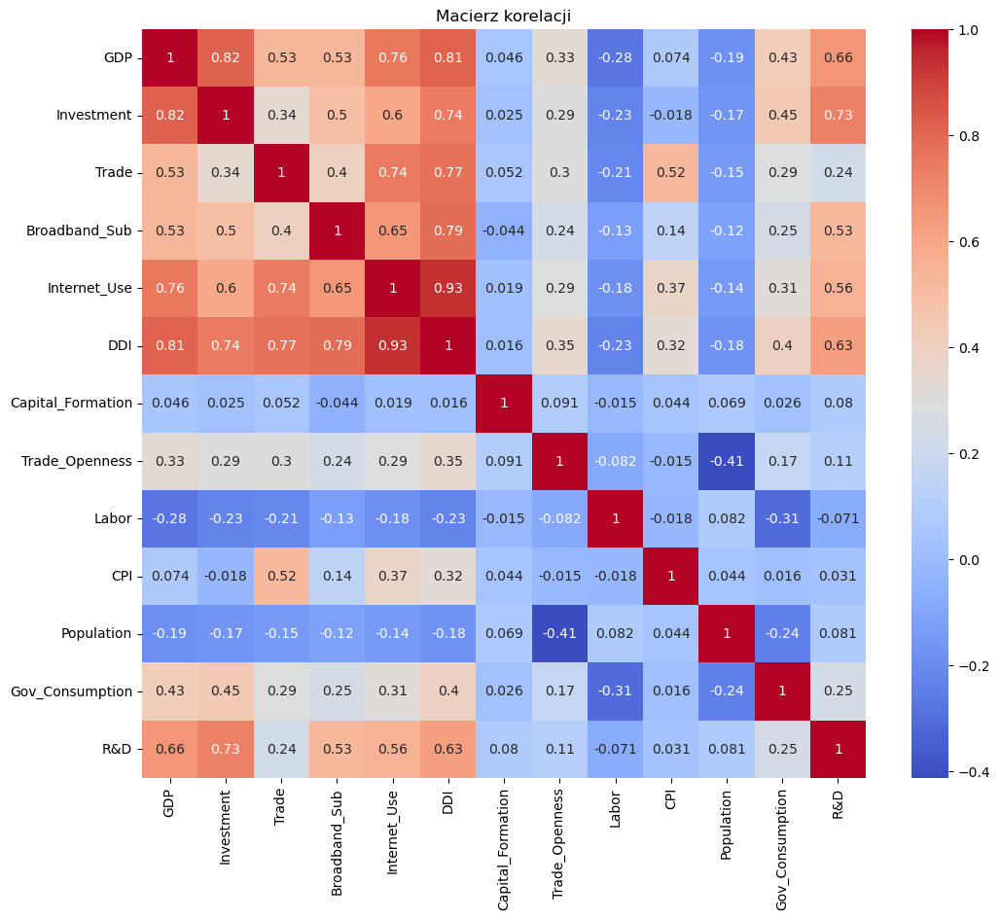

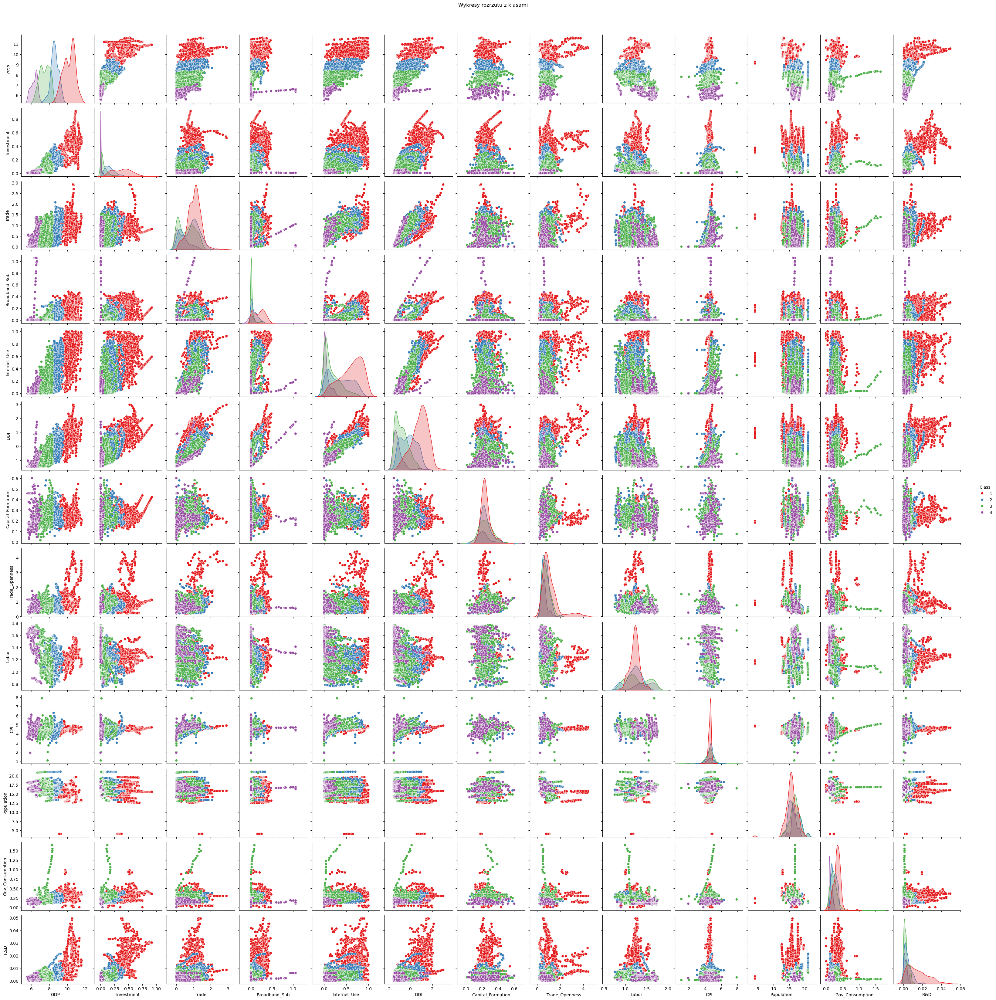

In [7]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Wczytaj dane
file_path = 'Dane.xlsx'  # Ścieżka do pliku
data = pd.read_excel(file_path)

# Wybór interesujących kolumn, w tym kolumny z klasą
data_cleaned = data.iloc[:, 10:].copy()  # Zakładam, że kolumna klasy jest w zakresie iloc

# Zmień nazwy kolumn dla przejrzystości, uwzględniając kolumnę "Class"
data_cleaned.columns = [
    "GDP", "Investment", "Trade", "Broadband_Sub", "Internet_Use", "DDI",
    "Capital_Formation", "Trade_Openness", "Labor", "CPI", "Population",
    "Gov_Consumption", "R&D", "Class"
]

# Mapowanie klas na tekstowe wartości, bez konwersji na numeryczne
class_mapping = {
    "High Income": 1,
    "Upper middle income": 2,
    "Lower middle income": 3,
    "Low Income": 4,
    "Very Low Income": 5
}

# Zachowaj klasę w formacie tekstowym dla wykresów
# Konwertowanie klas do kategorii, by móc je później używać w pairplot
data_cleaned["Class"] = data_cleaned["Class"].astype("category")

# Konwersja wszystkich kolumn na typ liczbowy (poza "Class")
data_cleaned.iloc[:, :-1] = data_cleaned.iloc[:, :-1].apply(pd.to_numeric, errors='coerce')

# Usuń wiersze z brakującymi wartościami
data_cleaned.dropna(inplace=True)

# Sprawdzanie, czy pozostały jakiekolwiek wiersze z brakującymi danymi
print(f"Liczba wierszy po oczyszczeniu: {len(data_cleaned)}")

# Wykres boxplot dla wszystkich zmiennych
plt.figure(figsize=(12, 10))
plt.xticks(rotation=90)
sns.boxplot(data=data_cleaned)
plt.title('Rozkład danych')
plt.show()

# Macierz korelacji, uwzględniając kolumnę "Class"
plt.figure(figsize=(12, 10))
corr_matrix = data_cleaned.iloc[:, :-1].corr()  # Nie uwzględniamy kolumny "Class" w macierzy korelacji
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Macierz korelacji')
plt.show()

# Wykresy rozrzutu (pairplot) z kolorami zależnymi od klasy
sns.pairplot(data_cleaned, hue="Class", kind='scatter', palette="Set1")
plt.suptitle('Wykresy rozrzutu z klasami', y=1.02)  # Dopasowanie tytułu
plt.show()


**<span style="color:blue;">Nazwy poszczególnych kategorii:</span>**

- **GDP**: Produkt Krajowy Brutto
- **Investment**: Inwestycje
- **Trade**: Miara otwartości gospodarki na handel międzynarodowy
- **Broadband_Sub**: Liczba subskrypcji szerokopasmowego internetu na 100 osób
- **Internet_Use**: Procent populacji, która korzysta z internetu
- **DDI**: Indeks digitalizacji
- **Capital_Formation**: Inwestycje w środki trwałe w kraju
- **Trade_Openness**: Otwartość gospodarki na handel międzynarodowy
- **Labor**: Siła robocza, mierzona jako wskaźnik aktywności zawodowej
- **CPI**: Indeks cen towarów i usług konsumpcyjnych
- **Population**: Liczba ludności danego kraju
- **Gov_Consumption**: Wydatki rządowe na dobra i usługi konsumpcyjne
- **R&D**: Nakłady na badania i rozwój (research and development)



**<span style="color:blue;">Wnioski dotyczące pudełkowego rozkładu danych:</span>**

**Różne kategorie posiadają zróżnicowane rozkłady. Niektóre są szerokie, takie jak:**
- **GDP** - Produkt Krajowy Brutto
- **DDI** - Indeks digitalizacji
- **Population** - Wielkość populacji
Pozostałe wykazują wąską zmienność co świadczy o ich mniejszej zmienności.
Wynika to z różnorodności kulturowych i gospodarczych poszczególych krajów.

**Wartości odstające dostrzec możemy w szczególności w kategoriach** 
- **Trade_Openess** Otwartość gospodarki na handel międzynarodowy
- **Population** Liczba ludności danego kraju
- **CPI**: Indeks cen towarów i usług konsumpcyjnych.
Wynika to z układów społecznych (dzietność) jak i polityką danego państwa.

**<span style="color:blue;">Wnioski dotyczące macieży korelacji:</span>**

**Dobrą korelację (powyżej 0,75) wykazują między sobą atrybuty:**
- **Investment** i **GDP**
- **GDP** i **Internet_Use**
- **GDP** i **DDI**
- **DDI** i **Trade**
- **Broadband_Sub** i **DDI**
- **DDI** i **Internet_Use**

Dzięki tym wynikom od razu widać, iż dane zostały zebrane prawidłowo np. logicznym jest, iż Liczba subskrypcji szerokopasmowego internetu będzie rosnąc wrast ze wzrostem Indeksu digitalizacji.

**Dobrą korelację ujemną (która i tak jest stosunkowo niska, bo jedynie ok. 41%) wykazuję:**
- **Population** i **Trade_Openness**

**Pozostałe współczynniki są na tyle niskie, że nie widać jakichś ich wzajemnych oddziaływań.**

**<span style="color:blue;">Wnioski dotyczące wykresów punktowych:</span>**

Wykresy punktowe idealnie oddają rzetelność analizy macierzy korelacji danych, przedstawiają, że wraz ze wzroestem parametru 1 rośnie parametr 2.
Dodatkowo zaznaczonę poszczególnymi kolorami są również poziomy zamożności krajów zawierających poszczególne dane- 1(najzamożniejsze) czerowne 2 niebieskie 3 zielone 4(najmniej zamożne) fioletowe
- **Investment** i **GDP**
- **GDP** i **Internet_Use**
- **GDP** i **DDI**
- **DDI** i **Trade**
- **Broadband_Sub** i **DDI**
- **DDI** i **Internet_Use**

**Dodatkowo rozróżnienie zamożności, wsakuzuję, iż dane na podobnych poziomach, będą świadczyć o podobnym poziomie zamożności, co pokazuję poprawność dancyh i będzie wykorzystywano później w uczeniu maszynowym**

**CZĘŚĆ 2:**

# Importowanie bibliotek
W tej sekcji importujemy wszystkie niezbędne biblioteki, takie jak `numpy`, `pandas`, `matplotlib`, a także funkcje i klasy z biblioteki `sklearn` do przetwarzania danych i budowy modeli.

In [12]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import VotingClassifier
from sklearn.neural_network import MLPClassifier

from sklearn.neighbors import NearestNeighbors
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import NearestCentroid
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LinearRegression
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn import tree

# Podgląd danych wejściowych
Wyświetlenie przetworzonych danych w celu sprawdzenia ich struktury i zawartości.


In [14]:
print(data_cleaned)

            GDP  Investment     Trade  Broadband_Sub  Internet_Use      DDI  \
0     10.607994    0.620927  0.675303       0.016325      0.439844  0.39172   
1     10.623448    0.509298  0.685303       0.026325      0.449844  0.26795   
2     10.619236    0.498189  0.695303       0.036325      0.459844  0.29133   
3     10.616073    0.484293  0.705303       0.046325      0.469844  0.31063   
4     10.632253    0.482649  0.715303       0.056325      0.479844  0.34787   
...         ...         ...       ...            ...           ...      ...   
2725   6.928162    0.054019  1.085002       0.000693      0.204700 -0.49949   
2726   6.972050    0.053940  1.115282       0.000676      0.219600 -0.46405   
2727   7.020765    0.053940  1.098800       0.000676      0.219600 -0.47398   
2728   7.068250    0.053857  1.179592       0.000644      0.219600 -0.42550   
2729   7.089293    0.052634  1.214556       0.000629      0.219600 -0.40626   

      Capital_Formation  Trade_Openness    Labor   

## Skalowanie danych:
Skalowanie danych jest niezbędne, aby uniknąć dominacji zmiennych o dużym zakresie wartości nad tymi o mniejszym zakresie. Używamy `StandardScaler`, który przekształca dane do rozkładu o średniej 0 i odchyleniu standardowym 1.


# Przygotowanie danych
1. Usuwamy kolumnę `Capital_Formation`, która nie będzie używana w analizie.
2. Wybieramy tylko kolumny `Internet_Use`, `GDP` i `Class` do dalszej analizy.


In [17]:
d2 = data_cleaned.drop('Capital_Formation', axis=1)
d2 = d2[['Internet_Use', 'GDP', 'Class']]

# Funkcja do podziału danych
Funkcja `podziel` dzieli dane na zbiór uczący i testowy na podstawie podanej proporcji.
- Atrybuty opisujące znajdują się w kolumnach oprócz ostatniej.
- Kolumna decyzyjna to ostatnia kolumna.



In [19]:
def podziel(df,proporcja):
    # dzieli macierz (ramkę) danych na zbiór uczacy i testowy
    # df - ramka danych; proporcja - proporcja podzialu (0-1)
    # zwraca słownik z kluczami:
    # opis_ucz/opis_test - macierz atrybutów opisujących zbioru uczącego/testowego
    # dec_ucz/dec_test - wektor wartosci atrybutu decyzyjnego zbioru uczącego/testowego
    # uwaga: atrybut opisujący jest zawsze na końcu (ostatnia kolumna ramki)
    opis_ucz, opis_test, dec_ucz, dec_test = train_test_split(df.iloc[:,0:-1], df.iloc[:,-1].astype('category').cat.codes, test_size=proporcja)#, random_state=0)
    return {"opis_ucz":opis_ucz, "opis_test":opis_test, "dec_ucz":dec_ucz, "dec_test":dec_test}

# Podział danych
Dzielimy dane na zbiory uczący i testowy w stosunku 70:30.


In [21]:
d = podziel(d2,0.3)

# Model klasyfikatora KNN
Tworzymy model klasyfikatora KNN z jednym sąsiadem


In [23]:
model = KNeighborsClassifier(n_neighbors=5)

# Funkcja do rysowania granic decyzyjnych
Ta funkcja rysuje granice decyzyjne modelu dla dwóch wybranych atrybutów. Granice są obliczane na podstawie siatki punktów i wizualizowane na wykresie.


In [26]:
def granice(model,dane,atr_x, atr_y,tytul,kontur = 1):
    # wyświetla granice decyzyjne
    # model - model klasyfikatora
    # dane - dane (słownik zwracany przez funkcje podziel)
    # atr_x/atr_y - artybut wyswietlany na osi x/y
    # tytul - wyświetlany tytuł wykresu
    # kontur - par. opcjonalny (=0 -> brak konturu)
    if (kontur == 1):    
        model.fit(np.array(dane["opis_ucz"].iloc[:,[atr_x,atr_y]]), np.array(dane["dec_ucz"]))
        x_min = min(dane["opis_ucz"].iloc[:, atr_x].min(),dane["opis_test"].iloc[:, atr_x].min())
        x_max = max(dane["opis_ucz"].iloc[:, atr_x].max(),dane["opis_test"].iloc[:, atr_x].max())
        y_min = min(dane["opis_ucz"].iloc[:, atr_y].min(),dane["opis_test"].iloc[:, atr_y].min())
        y_max = max(dane["opis_ucz"].iloc[:, atr_y].max(),dane["opis_test"].iloc[:, atr_y].max())
        rozst_x = x_max - x_min
        rozst_y = y_max - y_min
        x_min = x_min - 0.1*rozst_x
        x_max = x_max + 0.1*rozst_x
        y_min = y_min - 0.1*rozst_y
        y_max = y_max + 0.1*rozst_y       
        xx, yy = np.meshgrid(np.arange(x_min, x_max, (x_max-x_min)/150),
                     np.arange(y_min, y_max, (y_max-y_min)/150))
        Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
        Z = Z.reshape(xx.shape)
    plt.figure(dpi = 100)
    plt.title(tytul)
    if (kontur == 1):
        plt.contourf(xx, yy, Z, levels = 4, alpha=0.2)
    plt.scatter(dane["opis_ucz"].iloc[:, atr_x], dane["opis_ucz"].iloc[:, atr_y], c=dane["dec_ucz"], marker = '.')
    plt.scatter(dane["opis_test"].iloc[:, atr_x], dane["opis_test"].iloc[:, atr_y], c=dane["dec_test"], marker = 'x')

# Weryfikacja klasyfikatora
Wyświetlamy wyniki weryfikacji w postaci macierzy pomyłek i dokładności modelu na zbiorze uczącym i testowym.


In [28]:
def weryfikuj(model,dane,atryb):
    # wyswietla wynik weryfikacji klasyfikatora w postaci macierzy pomyłek
    # dla zbioru uczącego i testowego
    # model - model klasyfikatora
    # dane - dane (słownik zwracany przez funkcje podziel)
    # atryb - lista atrybutów uwzględnianych w weryfikacji
    model.fit(dane["opis_ucz"].iloc[:,atryb], dane["dec_ucz"])
    wynik_ucz = model.predict(dane["opis_ucz"].iloc[:,atryb])
    wynik_test = model.predict(dane["opis_test"].iloc[:,atryb])
    mp = confusion_matrix(dane["dec_ucz"],wynik_ucz)
    print("macierz pomyłek - zbiór uczący, dokładność:",np.sum(np.diag(mp))/np.sum(mp))
    print(model.score(d['opis_ucz'],d['dec_ucz']))
    print(mp)
    mp = confusion_matrix(dane["dec_test"],wynik_test)
    print("macierz pomyłek - zbiór testowy, dokładność:",np.sum(np.diag(mp))/np.sum(mp))
    print(model.score(d['opis_test'],d['dec_test']))
    print(mp) 

macierz pomyłek - zbiór uczący, dokładność: 0.9015706806282723
0.9015706806282723
[[710  33   0   0]
 [ 36 418  39   0]
 [  0  36 417  20]
 [  0   0  24 177]]
macierz pomyłek - zbiór testowy, dokładność: 0.8608058608058609
0.8608058608058609
[[291  16   0   0]
 [ 13 160  26   0]
 [  0  32 179   9]
 [  0   0  18  75]]


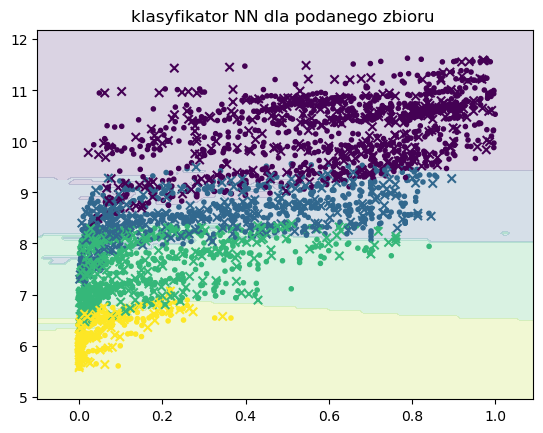

In [29]:
ax, ay = 0,1
# granice dycyzyjne
granice(model,d,ax,ay,"klasyfikator NN dla podanego zbioru ")
# weryfikacja
weryfikuj(model,d,[ax,ay])

**Dokładność klasyfikatora:**

Na zbiorze uczącym: około 90.29% (0.9029)
Na zbiorze testowym: około 87.91% (0.8791)

Różnica około 2.38 punktu procentowego między zbiorem uczącym a testowym wskazuje na brak przeuczenia modelu.


**Analiza macierzy pomyłek:**

**Dla zbioru uczącego:**

Najlepiej klasyfikowana jest klasa reprezentowana w górnym lewym rogu (746 poprawnych klasyfikacji)
Występują błędy klasyfikacji szczególnie w środkowych klasach (49, 39, 21 błędnych klasyfikacji)
Najniższa klasa ma stosunkowo mało błędów (185 poprawnych klasyfikacji)

**Dla zbioru testowego:**

Zachowuje podobny wzorzec jak w zbiorze uczącym
Proporcjonalnie mniejsza liczba przypadków ze względu na mniejszy rozmiar zbioru testowego
Widoczne podobne wzorce błędów klasyfikacji


**Wizualizacja granic decyzyjnych:**

Widoczny jest wyraźny podział na 5 klas (reprezentowanych różnymi kolorami)
Granice między klasami nie są ostre, co jest charakterystyczne dla klasyfikatora k-NN
Występuje pewne nakładanie się klas, szczególnie w środkowych obszarach
Punkty oznaczone krzyżykami (×) reprezentują błędnie sklasyfikowane przypadki


**Podsumowanie**
Klasyfikator osiąga zadowalającą skuteczność (>87% na zbiorze testowym)
Największe trudności w klasyfikacji występują na granicach między klasami
Model radzi sobie lepiej z klasami skrajnymi niż ze środkowymi

# Porównanie modeli KNN dla różnych wartości sąsiadów
Sprawdzamy, jak zmieniają się granice decyzyjne dla różnych liczby sąsiadów w modelu KNN.


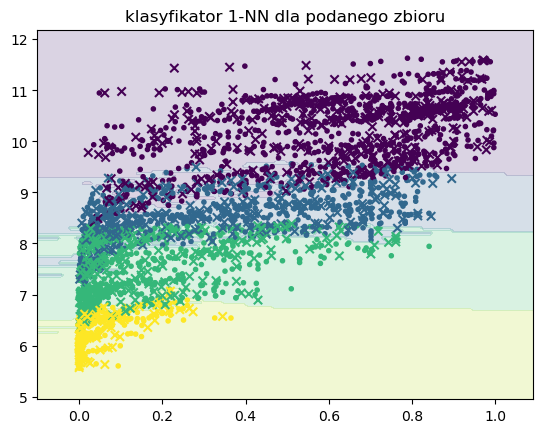

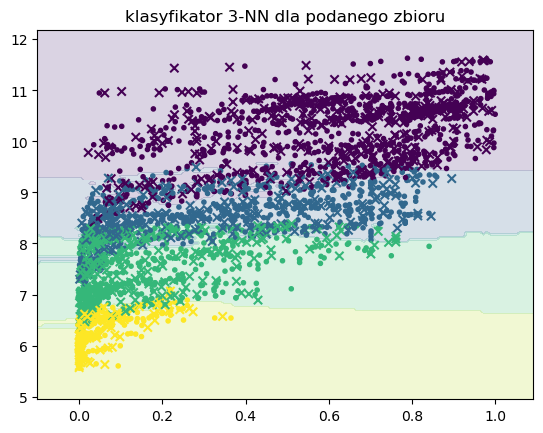

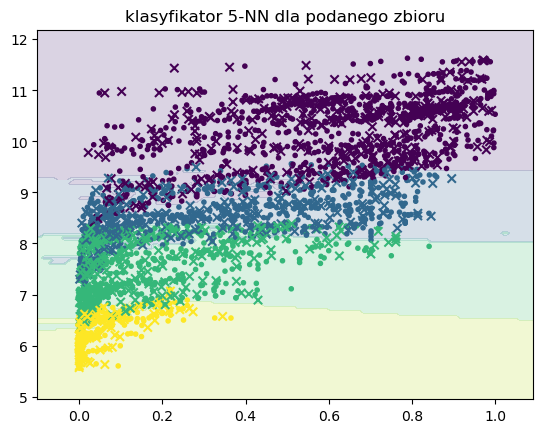

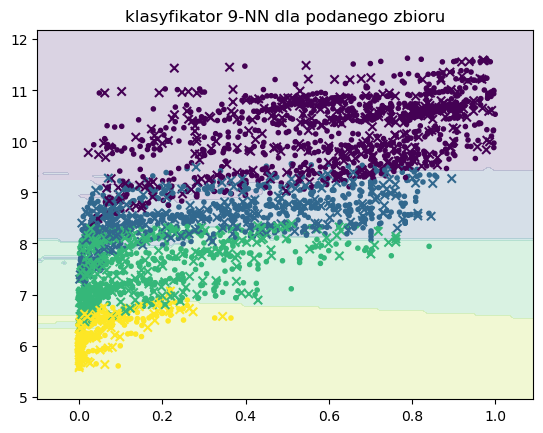

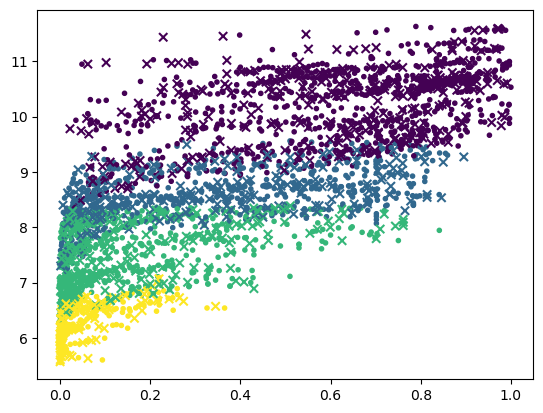

In [32]:
for k in [1,3,5,9]:
    model_knn = KNeighborsClassifier(n_neighbors=k)
    granice(model_knn,d,0,1,"klasyfikator " + str(k)+ "-NN dla podanego zbioru")


granice(model,d,0,1,"",0)

**Wpływ wartości k na granice decyzyjne:**

Dla k=1 granice między klasami są najbardziej nieregularne i "postrzępione"
Wraz ze wzrostem k (3, 5, 9) granice stają się bardziej wygładzone i mniej wrażliwe na pojedyncze przypadki
Większe wartości k prowadzą do bardziej uogólnionych granic decyzyjnych

**Stabilność klasyfikacji:**

Przy k=1 model jest najbardziej podatny na szum w danych
Wraz ze wzrostem k widać większą stabilność granic między klasami
Klasyfikator z k=5 wydaje się oferować dobry kompromis między szczegółowością a stabilnością

**Rozkład klas:**

Widoczne jest wyraźne rozgraniczenie między 5 klasami (oznaczone różnymi kolorami)
Występuje pewne nakładanie się klas, szczególnie w środkowych obszarach
Klasy skrajne (żółta i fioletowa) są lepiej separowalne niż klasy środkowe

**Błędy klasyfikacji:**

Punkty oznaczone krzyżykami (×) pokazują błędnie sklasyfikowane przypadki
Największa liczba błędów występuje na granicach między klasami
Wraz ze wzrostem k zmienia się rozkład błędów, ale nie znikają one całkowicie

**Dla tego zbioru danych wartość k=5 wydaje się być optymalnym wyborem, oferując dobry balans między dokładnością a generalizacją.**

# Analiza błędu dla różnych wartości `k`
Tworzymy wykres błędu klasyfikatora w zależności od liczby sąsiadów.


Text(0, 0.5, 'Prawdopodobienstwo bledu')

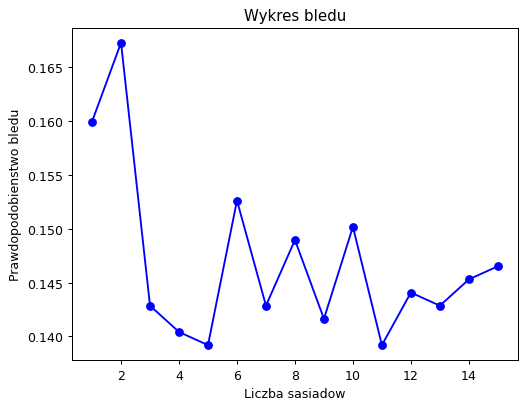

In [35]:
kvals = range(1, 16)
rss_all = np.zeros(15)
for k in kvals:
    model = KNeighborsClassifier(n_neighbors=k)
    model.fit(d['opis_ucz'],d['dec_ucz'])
    predictions = model.predict(d['opis_test'])
    rss_all[k-1] = 1-model.score(d['opis_test'],d['dec_test'])
plt.figure(dpi=90)
plt.plot(kvals, rss_all,'bo-')
plt.title('Wykres bledu')
plt.xlabel('Liczba sasiadow')
plt.ylabel('Prawdopodobienstwo bledu')

**Wnioski na podstawie wykresu błędów**

Prawdopodobieństwo błędu waha się między około 0.12 a 0.155, dzięki czemu jesteśmy w stanie stwierdzić, że klasyfikator osiąga dokładność na poziomie 84.5-88%.

Najmniejszy błąd (około 0.12) występuje dla k=5, co sugeruje, że jest to optymalna liczba sąsiadów dla tego konkretnego zbioru danych.

Widoczny jest ogólny trend spadkowy błędu przy zwiększaniu k od 1 do 5, po czym następuje stabilizacja z niewielkimi wahaniami.

Dla k=2 występuje lokalne maksimum błędu (około 0.155), co może sugerować, że używanie parzystej liczby sąsiadów nie jest optymalne w tym przypadku (tą terorie potwierdza również cyfra k =4).

Dla większych wartości k (>10) błąd zaczyna ponownie wzrastać, co może wskazywać na przeuczenie modelu - zbyt duża liczba sąsiadów może prowadzić do zbyt dużego uśrednienia wyników.

Na podstawie wykresu, zalecane jest użycie k=5, ponieważ daje to najmniejszy błąd klasyfikacji.

# Porównanie modeli DecisionTreeClassifier dla różnych wartości głębokości drzewa

macierz pomyłek - zbiór uczący, dokładność: 0.8654450261780104
0.8654450261780104
[[676  67   0   0]
 [ 19 378  96   0]
 [  0  13 417  43]
 [  0   0  19 182]]
macierz pomyłek - zbiór testowy, dokładność: 0.851037851037851
0.851037851037851
[[280  27   0   0]
 [ 11 142  46   0]
 [  0  10 199  11]
 [  0   0  17  76]]


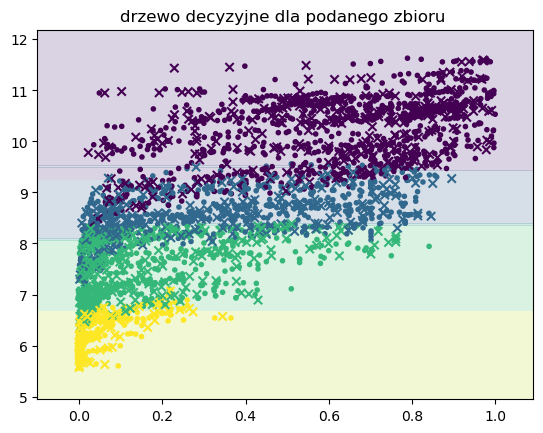

In [40]:
model = tree.DecisionTreeClassifier(max_depth=4)
# granice dycyzyjne
granice(model,d,0,1,"drzewo decyzyjne dla podanego zbioru ")
# weryfikacja
weryfikuj(model,d,[0,1])

macierz pomyłek - zbiór uczący, dokładność: 0.6052356020942409
0.6052356020942409
[[683   0  60   0]
 [ 38   0 455   0]
 [  0   0 473   0]
 [  0   0 201   0]]
macierz pomyłek - zbiór testowy, dokładność: 0.612942612942613
0.612942612942613
[[282   0  25   0]
 [ 13   0 186   0]
 [  0   0 220   0]
 [  0   0  93   0]]
macierz pomyłek - zbiór uczący, dokładność: 0.7811518324607329
0.7811518324607329
[[683  60   0   0]
 [ 38 414  41   0]
 [  0  78 395   0]
 [  0   0 201   0]]
macierz pomyłek - zbiór testowy, dokładność: 0.7594627594627594
0.7594627594627594
[[282  25   0   0]
 [ 13 167  19   0]
 [  0  47 173   0]
 [  0   0  93   0]]
macierz pomyłek - zbiór uczący, dokładność: 0.8570680628272251
0.8570680628272251
[[676  67   0   0]
 [ 25 427  41   0]
 [  0  78 352  43]
 [  0   0  19 182]]
macierz pomyłek - zbiór testowy, dokładność: 0.8351648351648352
0.8351648351648352
[[277  30   0   0]
 [ 11 169  19   0]
 [  0  47 162  11]
 [  0   0  17  76]]
macierz pomyłek - zbiór uczący, dokładność: 0

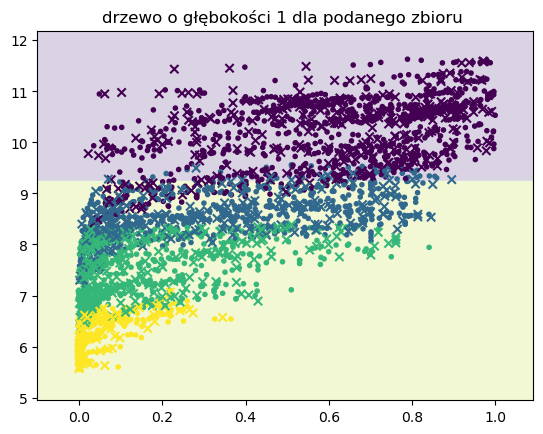

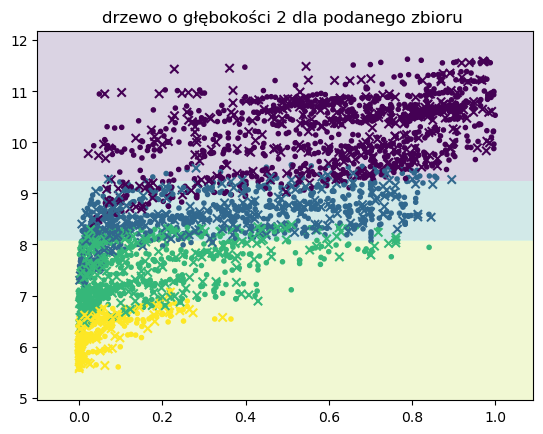

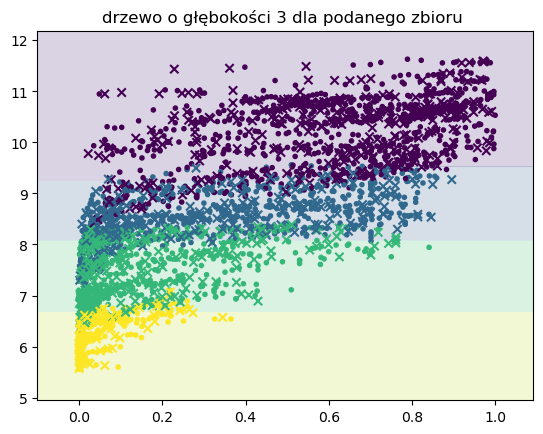

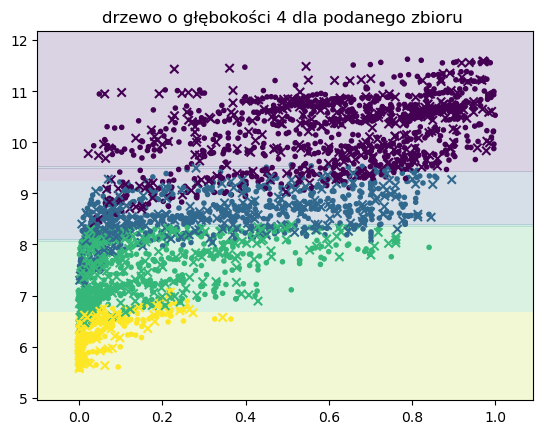

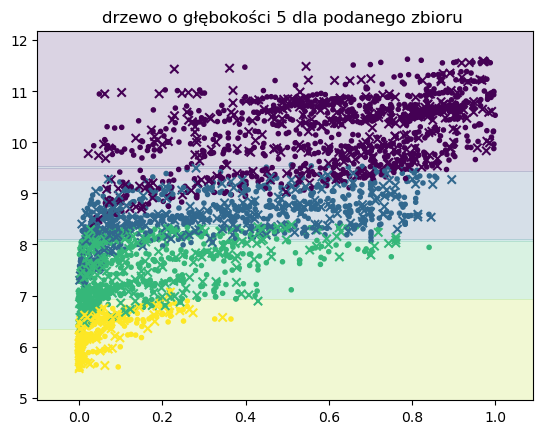

...

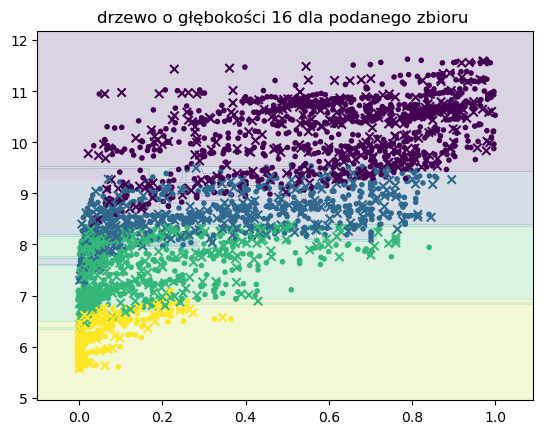

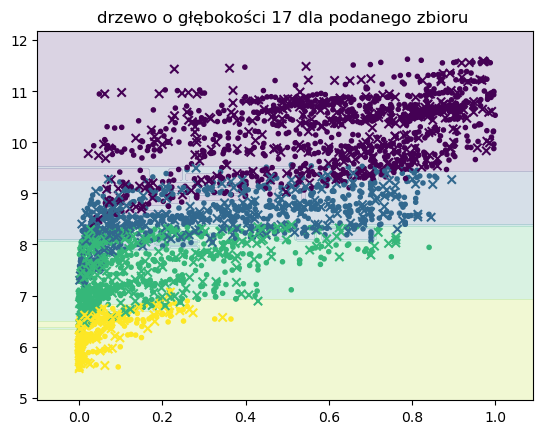

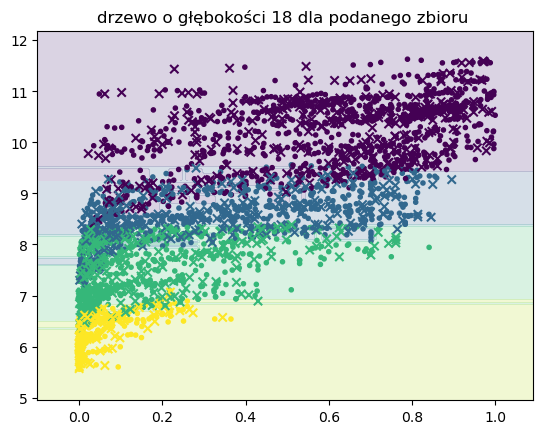

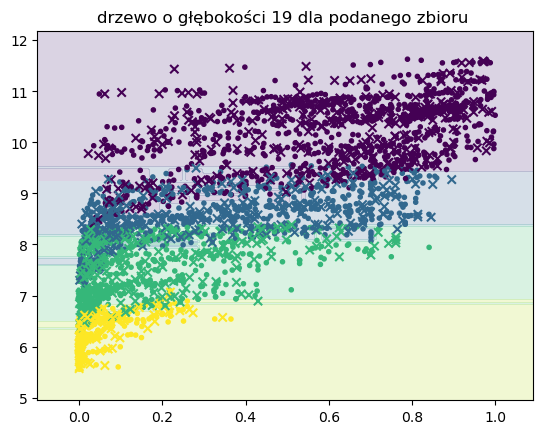

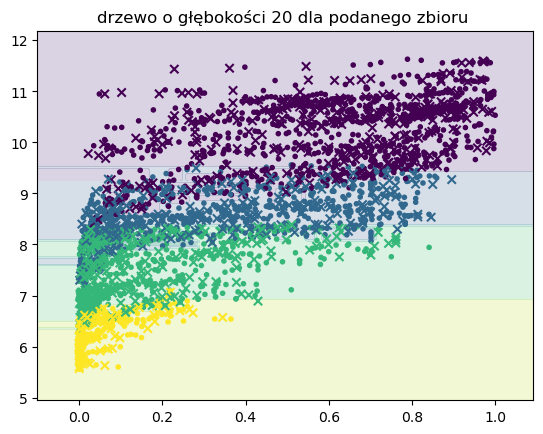

In [57]:
for g in [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]:
    drzewo = tree.DecisionTreeClassifier(max_depth=g)
    tekst = "drzewo o głębokości " + str(g) + " dla podanego zbioru "
    granice(drzewo ,d,0,1,tekst)
    weryfikuj(drzewo,d,[0,1])

Text(0, 0.5, 'Prawdopodobienstwo bledu')

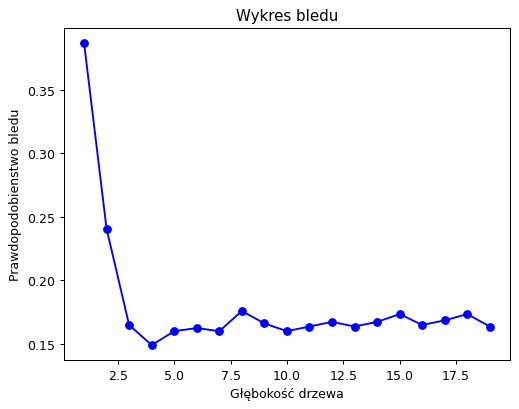

In [63]:
kvals = range(1, 20)
rss_all = np.zeros(19)
for k in kvals:
    model = tree.DecisionTreeClassifier(max_depth=k)
    model.fit(d['opis_ucz'],d['dec_ucz'])
    predictions = model.predict(d['opis_test'])
    rss_all[k-1] = 1-model.score(d['opis_test'],d['dec_test'])
plt.figure(dpi=90)
plt.plot(kvals, rss_all,'bo-')
plt.title('Wykres bledu')
plt.xlabel('Głębokość drzewa')
plt.ylabel('Prawdopodobienstwo bledu')

### Wnioski z analizy głębokości drzewa decyzyjnego

1. **Dla głębokości \( g = 4 \)**  
   Drzewo o głębokości \( g = 4 \) osiąga optymalną równowagę między dokładnością a generalizacją. Model dobrze dopasowuje się do danych uczących i testowych, co oznacza, że jest to "złoty środek". Nie występuje jeszcze zjawisko nadmiernego dopasowania (overfitting).

2. **Dla głębokości \( g > 4 \)**  
   Dla większych głębokości (\( g > 4 \)) model zaczyna nadmiernie dopasowywać się do danych uczących. Objawia się to bardzo wysoką dokładnością na zbiorze uczącym, ale lekkim spadkiem dokładności na zbiorze testowym. Jest to typowy przykład overfittingu, gdzie model zapamiętuje szczegóły danych uczących kosztem generalizacji.

3. **Dla głębokości \( g < 4 \)**  
   Przy mniejszych głębokościach drzewo jest zbyt proste, co prowadzi do underfittingu. Model nie jest w stanie dobrze uchwycić wzorców w danych, co skutkuje niską dokładnością zarówno na zbiorze uczącym, jak i testowym.

### Podsumowanie  
Głębokość \( g = 4 \) jest optymalna dla tego zbioru danych, ponieważ zapewnia najlepszy kompromis między dokładnością a generalizacją.  
Dla większych głębokości (\( g > 4 \)) należy uważać na zjawisko overfittingu, natomiast dla \( g < 4 \) model jest zbyt prosty, by uchwycić charakterystykę danych.
